# Methods Notebook: Extracting Call Samples for KMeans Clustering

## Imports Section:

In [15]:
import numpy as np
import pandas as pd
import random
import scipy
from scipy import stats
import datetime as dt
import dask.dataframe as dd

In [16]:
import librosa
import warnings

In [17]:
import glob
import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches
from pathlib import Path

In [18]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm

In [19]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
import src.file_dealer as file_dealer

## Function Definitions (most important functions are in `src/`)
### Below are the functions used for plotting and visualization

In [20]:
FREQ_COLORS = {'LF':'cyan', 'HF':'orange'}

In [21]:
def convert_nabatdf_to_ravenprodf(df):
    raven_df = pd.DataFrame()
    raven_df['Begin Time (s)'] =  (df['peak_time_ms']-50)/1000
    raven_df['End Time (s)'] = (df['peak_time_ms']-40)/1000
    raven_df['Low Freq (Hz)'] = df['peak_freq_hz']-2000
    raven_df['High Freq (Hz)'] = df['peak_freq_hz']+2000
    raven_df['prediction'] = df['prediction']
    raven_df['score'] = df['score']
    raven_df.sort_values('Begin Time (s)', inplace=True)
    raven_df.insert(0, 'Selection', np.arange(len(raven_df)).astype(int)+1)

    raventxt_df = pd.DataFrame(np.repeat(raven_df.values, 2, axis=0))
    raventxt_df.columns = raven_df.columns
    raventxt_df['Selection'] = raventxt_df['Selection'].astype(int)
    raventxt_df.insert(1, 'Channel', [1]*raventxt_df.shape[0])
    views = np.array(['Waveform 1']*raventxt_df.shape[0], dtype='object')
    views[1::2] = 'Spectrogram 1'
    raventxt_df.insert(1, 'View', views)

    return raventxt_df

def convert_nabatdf_to_bd2df(df):
    bd2_df = pd.DataFrame()
    bd2_df['start_time'] = (df['peak_time_ms']-50)/1000
    bd2_df['end_time'] = (df['peak_time_ms']-40)/1000
    bd2_df['low_freq'] = df['peak_freq_hz']-2000
    bd2_df['high_freq'] = df['peak_freq_hz']+2000
    bd2_df['prediction'] = df['prediction']
    bd2_df['score'] = df['score']
    bd2_df.sort_values('start_time', inplace=True)
    
    return bd2_df

def convert_kaleidoscopedf_to_ravenprodf(df):
    raven_df = pd.DataFrame()
    raven_df['Begin Time (s)'] = df['OFFSET']
    raven_df['End Time (s)'] = df['OFFSET'] + df['DURATION']
    raven_df['Low Freq (Hz)'] = df['Fmin']
    raven_df['High Freq (Hz)'] = df['Fmax']
    raven_df['input_file'] = df['IN FILE']
    raven_df['input_dir'] = df['INDIR']
    raven_df['mean_freq'] = df['Fmean']
    if 'TOP1MATCH*' in df.columns:
        raven_df['TOP1MATCH*'] = df['TOP1MATCH*']
    if 'TOP1MATCH' in df.columns:
        raven_df['TOP1MATCH'] = df['TOP1MATCH']
    raven_df['TOP1DIST'] = df['TOP1DIST']
    raven_df['TOP2MATCH'] = df['TOP2MATCH']
    raven_df['TOP2DIST'] = df['TOP2DIST']
    raven_df['TOP3MATCH'] = df['TOP3MATCH']
    raven_df['TOP3DIST'] = df['TOP3DIST']
    raven_df.sort_values('Begin Time (s)', inplace=True)
    raven_df.insert(0, 'Selection', np.arange(len(raven_df)).astype(int)+1)

    raventxt_df = pd.DataFrame(np.repeat(raven_df.values, 2, axis=0))
    raventxt_df.columns = raven_df.columns
    raventxt_df['Selection'] = raventxt_df['Selection'].astype(int)
    raventxt_df.insert(1, 'Channel', [1]*raventxt_df.shape[0])
    views = np.array(['Waveform 1']*raventxt_df.shape[0], dtype='object')
    views[1::2] = 'Spectrogram 1'
    raventxt_df.insert(1, 'View', views)

    return raventxt_df

def convert_kaleidoscopedf_to_bd2df(df):
    bd2_df = pd.DataFrame()
    bd2_df['start_time'] = df['OFFSET']
    bd2_df['end_time'] = df['OFFSET'] + df['DURATION']
    bd2_df['low_freq'] = df['Fmin']
    bd2_df['high_freq'] = df['Fmax']
    bd2_df['input_file'] = df['IN FILE']
    bd2_df['input_dir'] = df['INDIR']
    bd2_df['mean_freq'] = df['Fmean']
    if 'TOP1MATCH*' in df.columns:
        bd2_df['TOP1MATCH*'] = df['TOP1MATCH*']
    if 'TOP1MATCH' in df.columns:
        bd2_df['TOP1MATCH'] = df['TOP1MATCH']
    bd2_df['TOP1DIST'] = df['TOP1DIST']
    bd2_df['TOP2MATCH'] = df['TOP2MATCH']
    bd2_df['TOP2DIST'] = df['TOP2DIST']
    bd2_df['TOP3MATCH'] = df['TOP3MATCH']
    bd2_df['TOP3DIST'] = df['TOP3DIST']
    bd2_df.sort_values('start_time', inplace=True)
    
    return bd2_df

def convert_raventxtdf_to_bd2df(raventxt_df):
    bd2_human_df = raventxt_df[1::2].copy()
    bd2_human_df = bd2_human_df.drop(columns=['Selection', 'View', 'Channel'])
    bd2_human_df.rename(columns={'Begin Time (s)':'start_time',
                                'End Time (s)':'end_time',
                                'Low Freq (Hz)':'low_freq',
                                'High Freq (Hz)':'high_freq',
                                'Manually-Verified Phonic Group':'freq_group',
                                'SNR NIST Quick (dB)':'snr_nist_quick_dB',
                                'Delta Time (s)':'delta_time_s'}, inplace=True)
    bd2_human_df.sort_values('start_time', inplace=True)
    
    return bd2_human_df

def convert_bd2df_ravenpro(df: pd.DataFrame):
    """
    Converts a dataframe to the format used by RavenPro
    """

    ravenpro_df = df.copy()

    ravenpro_df.rename(columns={
        "start_time": "Begin Time (s)",
        "end_time": "End Time (s)",
        "low_freq": "Low Freq (Hz)",
        "high_freq": "High Freq (Hz)",
        "event": "Annotation",
        "freq_group":"Manually-Verified Phonic Group",
        'snr_nist_quick_dB':'SNR NIST Quick (dB)',
        'delta_time_s':'Delta Time (s)'
    }, inplace=True)

    ravenpro_df["Selection"] = np.arange(0, df.shape[0]).astype('int') + 1
    ravenpro_df["View"] = "Waveform 1"
    ravenpro_df["Channel"] = "1"

    return ravenpro_df

In [22]:
file_sites = {'20220730_053000':'Carp',
 '20220826_070000':'Central',
 '20220727_083000':'Foliage',
 '20220829_090000':'Foliage'}

extension = ".txt"
sep = "\t"
raventxt_human_files_dir = f'{Path.home()}/Documents/Research/mila_files/mila-human-wav-txt'
bd2_dets_save_dir = Path(f'20250127__group_threshold_sweep_results')

SITE_NAMES = {'Carp':'Carp Pond', 'Foliage':'Foliage', 'Central':'Central Pond'}

file_keys = list(file_sites.keys())
file_keys

['20220730_053000', '20220826_070000', '20220727_083000', '20220829_090000']

In [23]:
wav_filename = '20220826_070000'
site = file_sites[wav_filename]
plot_file = Path(f'{raventxt_human_files_dir}/{wav_filename}.WAV')
raventxt_human_filename = f'{wav_filename}_manually_verified_by_AK_with_groups'

In [24]:
snr_included_ravenpro_human_txt = pd.read_csv(f'{raventxt_human_files_dir}/{raventxt_human_filename}_ravenpro_SNR_aditya_SNR_and_peakfreqtime.txt', sep=sep)
bd2_human_df = snr_included_ravenpro_human_txt.copy()
bd2_human_df = bd2_human_df.drop(columns=['Selection', 'View', 'Channel'])
bd2_human_df.rename(columns={'Begin Time (s)':'start_time',
                            'End Time (s)':'end_time',
                            'Low Freq (Hz)':'low_freq',
                            'High Freq (Hz)':'high_freq',
                            'Delta Time (s)':'delta_time_s',
                            'Manually-Verified Phonic Group':'freq_group',
                            'SNR NIST Quick (dB)':'snr_nist_quick_dB'}, inplace=True)
bd2_human_df.sort_values('start_time', inplace=True)
bd2_human_df

,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time
0,1.729564,1.737108,44070.175,51087.719,0.0075,13.66,AK_echolocation,NaN,NaN,HF,2.567162,1.733019
1,3.770500,3.777100,45234.000,54096.000,0.0066,13.72,Echolocation,0.512,20220826_070000.WAV,HF,6.879404,3.773733
2,3.911402,3.918947,43903.720,56927.790,0.0075,15.01,AK_echolocation,NaN,NaN,HF,7.902035,3.914858
3,4.043419,4.050209,44281.690,58478.873,0.0068,11.30,AK_echolocation,NaN,NaN,HF,1.782390,4.046462
4,4.161126,4.170934,43903.720,56507.659,0.0098,11.50,AK_echolocation,NaN,NaN,HF,1.514990,4.166985
...,...,...,...,...,...,...,...,...,...,...,...,...
4401,1787.774500,1787.784900,37500.000,46675.000,0.0104,17.90,Echolocation,0.587,20220826_070000.WAV,HF,9.656562,1787.779767
4402,1787.959500,1787.969400,37500.000,45913.000,0.0099,13.38,Echolocation,0.591,20220826_070000.WAV,HF,6.562988,1787.964100
4403,1788.212500,1788.221200,39218.000,48186.000,0.0087,13.74,Echolocation,0.544,20220826_070000.WAV,HF,8.990165,1788.217133
4404,1788.413500,1788.422500,40078.000,49982.000,0.0090,14.19,Echolocation,0.566,20220826_070000.WAV,HF,5.589297,1788.419000


In [25]:
bd2_human_df_file_LF = bd2_human_df[bd2_human_df['freq_group']=='LF'].copy()
bd2_human_df_file_HF = bd2_human_df[bd2_human_df['freq_group']=='HF'].copy()

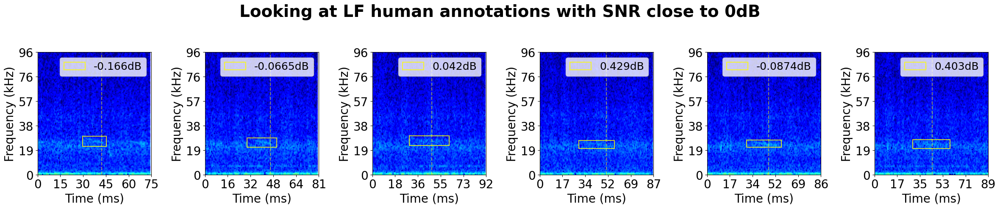

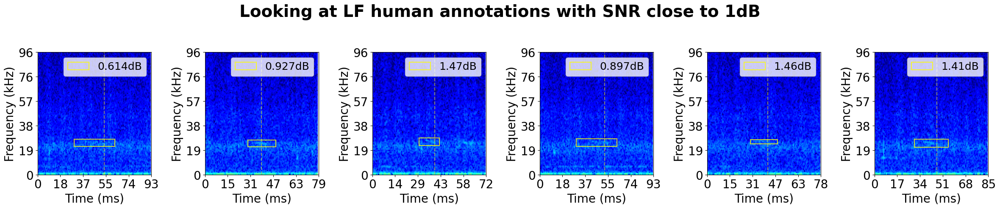

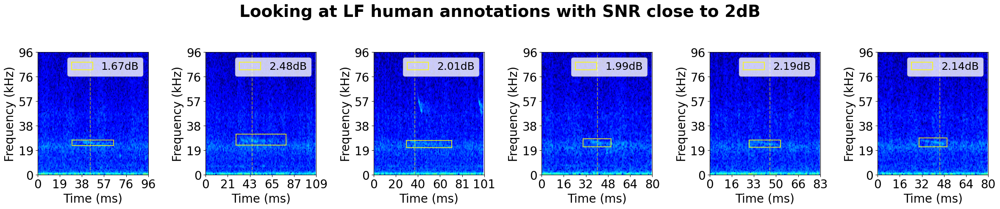

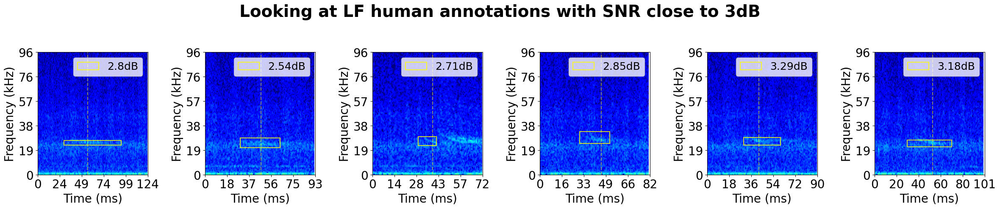

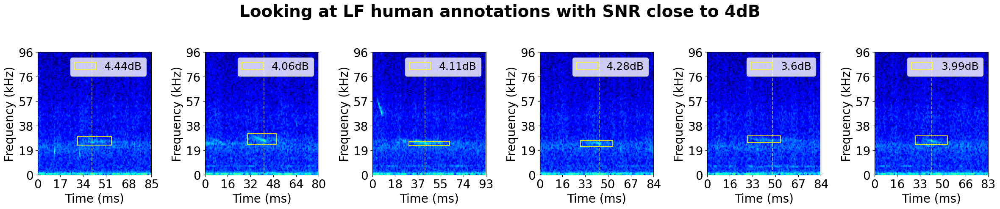

...

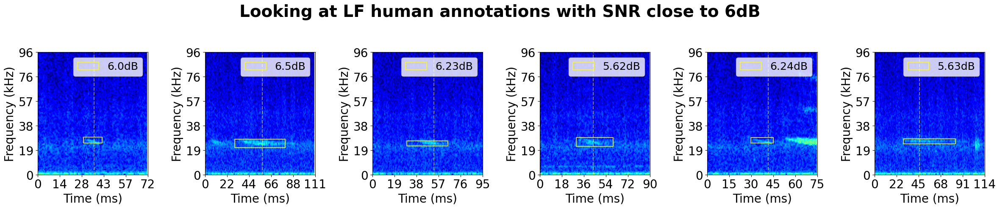

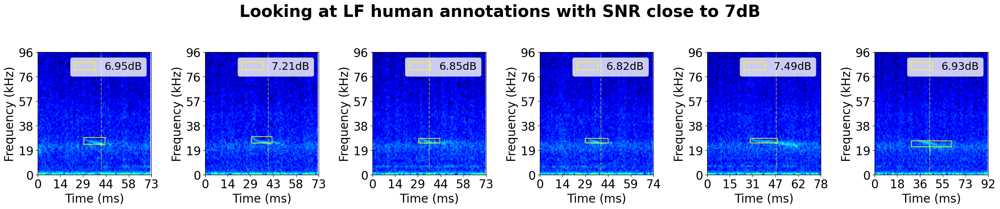

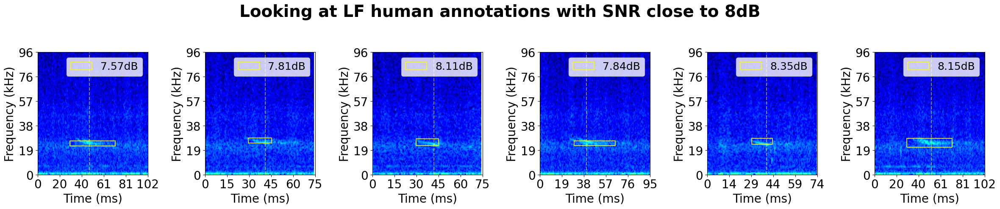

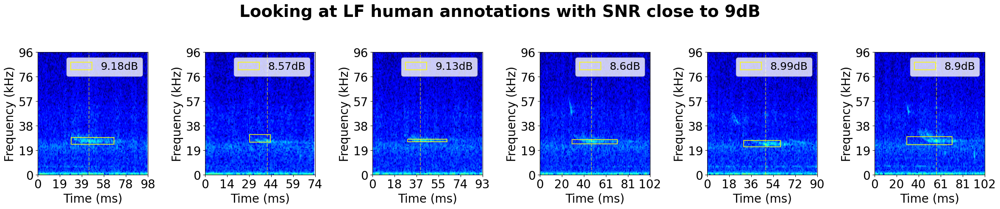

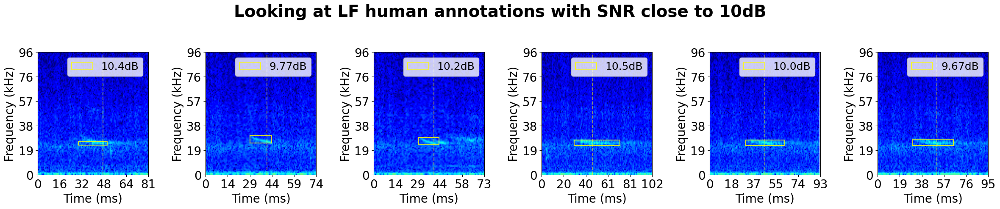

In [33]:
for snr_threshold in np.arange(0, 11, 1):
    num_samples = 6
    snrbased_selections = bd2_human_df_file_LF[np.isclose(bd2_human_df_file_LF['adityas_method_snr_dB'], snr_threshold, atol=0.5)].sample(n=num_samples).reset_index(drop=True).copy()
    plt.figure(figsize=(4*num_samples, 5))
    plt.rcParams.update({'font.size': 20})
    plt.suptitle(f'Looking at LF human annotations with SNR close to {snr_threshold}dB', y=1.01, fontsize=28, fontweight='bold')
    for i, sel_ind in enumerate((snrbased_selections.index).values):
        plt.subplot(1,num_samples,i+1)
        selection_row = snrbased_selections.iloc[sel_ind]
        file_name = f'{wav_filename}.WAV'
        file_path = Path(raventxt_human_files_dir) / file_name
        audio_file = sf.SoundFile(file_path)
        fs = audio_file.samplerate

        start = selection_row['start_time']-0.03
        audio_file.seek(int(fs*(start)))
        duration = (selection_row['end_time']-selection_row['start_time'])+0.06
        audio_seg = audio_file.read(int(fs*duration))

        plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

        ax = plt.gca()
        rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                        (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{selection_row["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=selection_row['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)
        plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
        plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
        plt.ylabel("Frequency (kHz)")
        plt.xlabel("Time (ms)")
        plt.legend(fontsize=18)

    plt.tight_layout()
    plt.show()

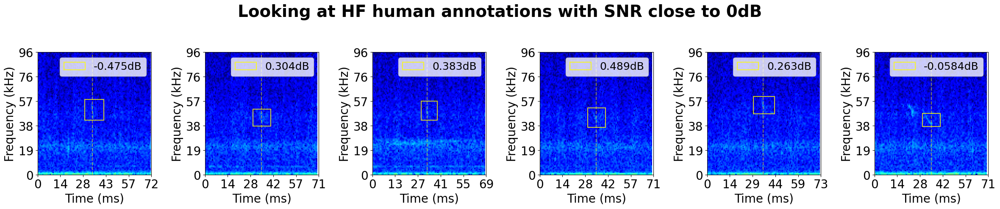

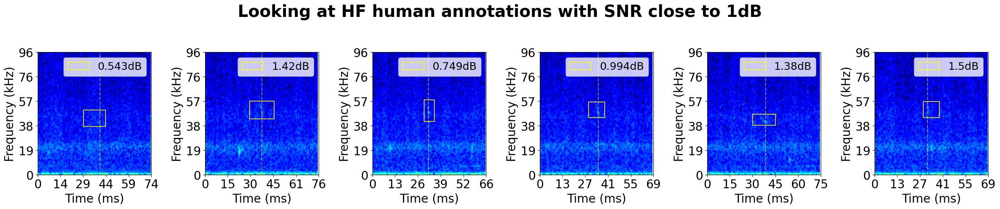

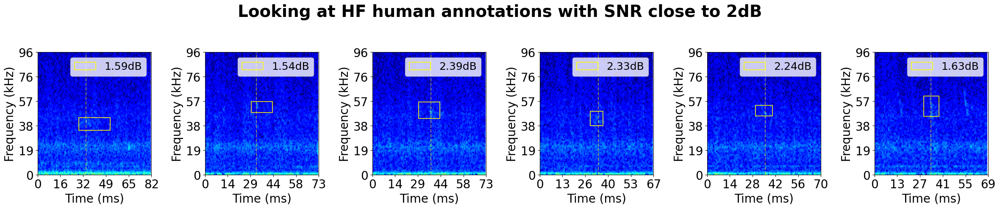

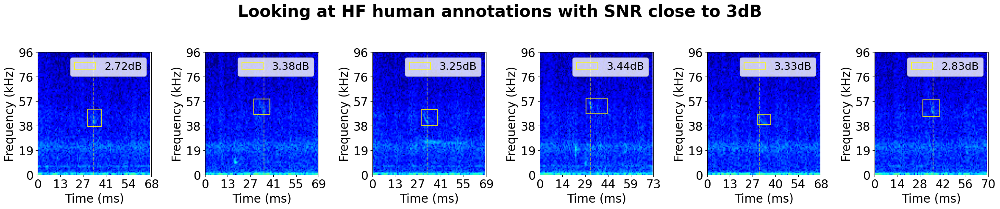

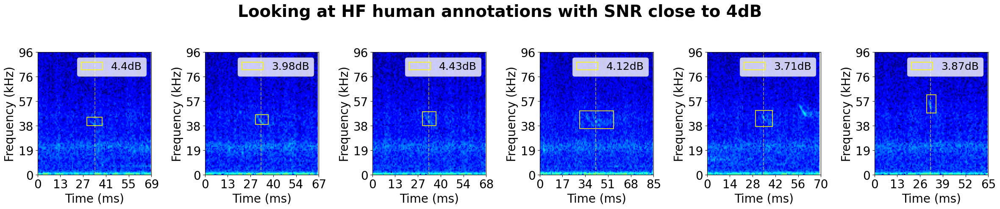

...

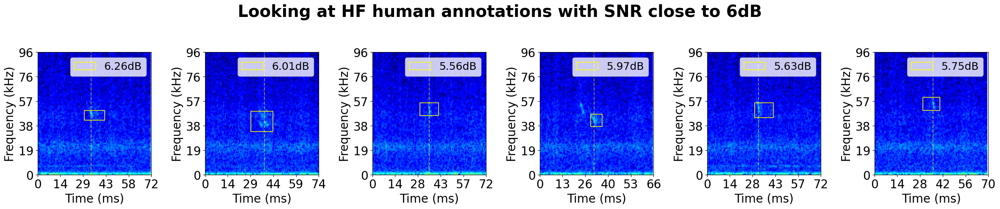

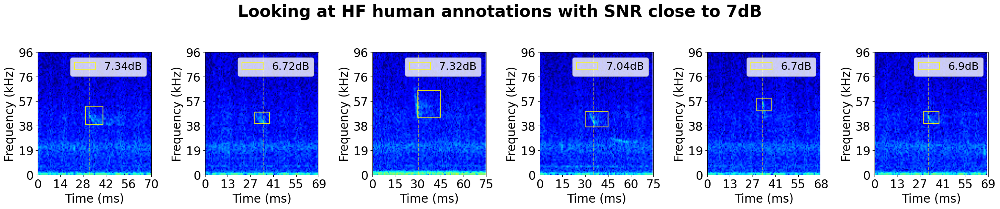

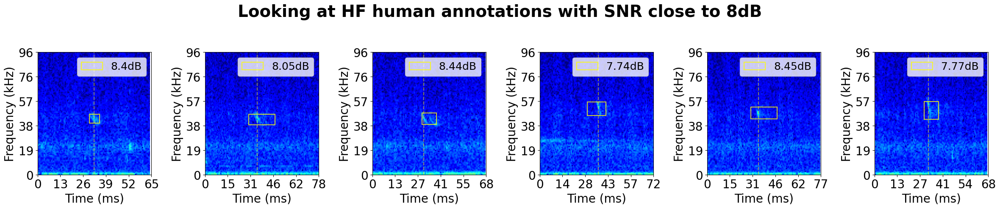

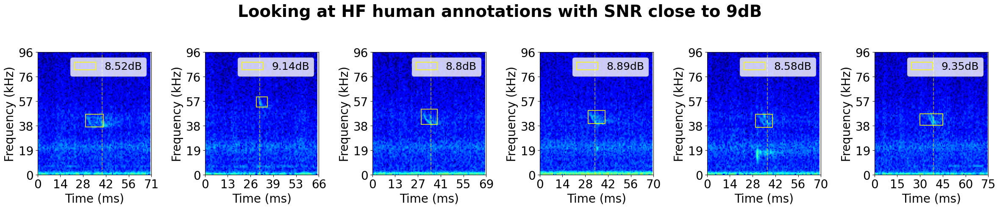

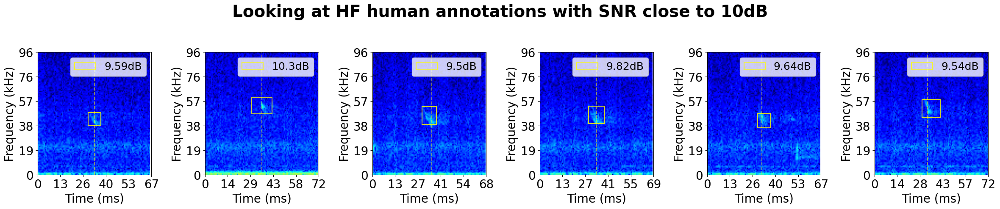

In [32]:
for snr_threshold in np.arange(0, 11, 1):
    num_samples = 6
    snrbased_selections = bd2_human_df_file_HF[np.isclose(bd2_human_df_file_HF['adityas_method_snr_dB'], snr_threshold, atol=0.5)].sample(n=num_samples).reset_index(drop=True).copy()
    plt.figure(figsize=(4*num_samples, 5))
    plt.rcParams.update({'font.size': 20})
    plt.suptitle(f'Looking at HF human annotations with SNR close to {snr_threshold}dB', y=1.01, fontsize=28, fontweight='bold')
    for i, sel_ind in enumerate((snrbased_selections.index).values):
        plt.subplot(1,num_samples,i+1)
        selection_row = snrbased_selections.iloc[sel_ind]
        file_name = f'{wav_filename}.WAV'
        file_path = Path(raventxt_human_files_dir) / file_name
        audio_file = sf.SoundFile(file_path)
        fs = audio_file.samplerate

        start = selection_row['start_time']-0.03
        audio_file.seek(int(fs*(start)))
        duration = (selection_row['end_time']-selection_row['start_time'])+0.06
        audio_seg = audio_file.read(int(fs*duration))

        plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

        ax = plt.gca()
        rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                        (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{selection_row["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=selection_row['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)
        plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
        plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
        plt.ylabel("Frequency (kHz)")
        plt.xlabel("Time (ms)")
        plt.legend(fontsize=18)

    plt.tight_layout()
    plt.show()